<a href="https://colab.research.google.com/github/TattooeDeer/spectral_super_resolution/blob/master/perdida%20perceptual.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SR espectral usando arquitecturas convolucionales y funciones de pérdida no convencionales
__Paper:__ Single Image Super-Resolution via Perceptual Loss Guided by Denoising Auto-Encoder


### Instructions to set-up the data path of the dataset

In the variable `BASE_PATH` it's expected to be the folder in which all the sub-folders of the different parts of the dataset are, this variable should hold the path to `Memoria` folder in the following image:

<img src = 'colab_instructions1.png'>

Note that you should connect to your Google Drive account and your should have authorization to access the folder, this authorization is given by the autor of this work on request.

In [1]:
#Uncomment this lines if you are in colab

!git clone https://github.com/TattooeDeer/spectral_super_resolution.git
!mv  /content/spectral_super_resolution/* ./

!pip install spectral

from google.colab import drive
drive.mount('/content/drive')

Cloning into 'spectral_super_resolution'...
remote: Enumerating objects: 21, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 21 (delta 7), reused 14 (delta 4), pack-reused 0
Unpacking objects: 100% (21/21), done.
     |████████████████████████████████| 215kB 3.9MB/s 
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
BASE_PATH = '/content/drive/My Drive/Memoria'

In [3]:
import torch
from torch import nn
from data_preproc import *
from datasets import *
from modelos import *
from utiles import *
from torchsummary import summary
from spectral import *
import matplotlib.pyplot as plt
import seaborn as sn
import torch.nn.functional as F
from torch.autograd import Variable

torch.manual_seed(0)


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')


Using device: cuda

Tesla P100-PCIE-16GB
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


## Conjuntos de datos

In [5]:
# Nota: HTH es HyperioToHyperion, es para poder entrenar el autoencoder

df_spectral_train_pre_HTH = SpectralDataset_npy(BASE_PATH + '/hyperion_train_npy', BASE_PATH + '/hyperion_train_npy')
df_spectral_train_pre = SpectralDataset_npy(BASE_PATH + '/landsat_train_npy', BASE_PATH + '/hyperion_train_npy')

df_spectral_train_HTH, df_spectral_val_HTH = random_split(df_spectral_train_pre_HTH,
                                                  [int(np.floor(len(df_spectral_train_pre_HTH)*0.8)),
                                                   int(np.ceil(len(df_spectral_train_pre_HTH)*0.2))])

df_spectral_train, df_spectral_val = random_split(df_spectral_train_pre,
                                                  [int(np.floor(len(df_spectral_train_pre)*0.8)),
                                                   int(np.ceil(len(df_spectral_train_pre)*0.2))])

df_spectral_test = SpectralDataset_npy(BASE_PATH + '/landsat_test_npy', BASE_PATH + '/hyperion_test_npy')
df_spectral_test_HTH = SpectralDataset_npy(BASE_PATH + '/hyperion_test_npy', BASE_PATH + '/hyperion_test_npy')


train_loader = DataLoader(dataset = df_spectral_train, batch_size = 32, shuffle = True)
train_loader_HTH = DataLoader(dataset = df_spectral_train_HTH, batch_size = 32, shuffle = True)

val_loader = DataLoader(dataset = df_spectral_val, batch_size = 32, shuffle = True)
val_loader_HTH = DataLoader(dataset = df_spectral_val_HTH, batch_size = 32, shuffle = True)

test_loader = DataLoader(dataset = df_spectral_test, batch_size = 1, shuffle = True)
test_loader_HTH = DataLoader(dataset = df_spectral_test_HTH, batch_size = 1, shuffle = True)

In [6]:
print(f'N° Ejemplos train: {len(df_spectral_train)}')
print(f'N° Ejemplos Test: {len(df_spectral_test)}')
print(f'N° Ejemplos Val: {len(df_spectral_val)}')
print(f'N° Ejemplos train (AutoEncoder): {len(df_spectral_train_HTH)}')
print(f'N° Ejemplos Test (AutoEncoder): {len(df_spectral_test_HTH)}')
print(f'N° Ejemplos Val (AutoEncoder): {len(df_spectral_val_HTH)}')

N° Ejemplos train: 3715
N° Ejemplos Test: 2314
N° Ejemplos Val: 929
N° Ejemplos train (AutoEncoder): 3715
N° Ejemplos Test (AutoEncoder): 2314
N° Ejemplos Val (AutoEncoder): 929


# Symmetric AutoEncoder


## SDAE 90/45/10

* $n_c$ upper block = 90
* $n_c$ middle block = 45
* $n_c$ lower block = 10

In [7]:
AEHG_90_45_10 = Hourglass(175, 175, 90, 45, 10)
AEHG_90_45_10.to(device);
summary(AEHG_90_45_10, input_size=(175, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 90, 64, 64]         141,840
         LeakyReLU-2           [-1, 90, 64, 64]               0
            Conv2d-3           [-1, 90, 64, 64]          72,990
         LeakyReLU-4           [-1, 90, 64, 64]               0
            Conv2d-5           [-1, 45, 64, 64]         101,295
         LeakyReLU-6           [-1, 45, 64, 64]               0
            Conv2d-7           [-1, 45, 64, 64]          50,670
         LeakyReLU-8           [-1, 45, 64, 64]               0
            Conv2d-9           [-1, 10, 64, 64]           4,060
        LeakyReLU-10           [-1, 10, 64, 64]               0
           Conv2d-11           [-1, 10, 64, 64]             910
        LeakyReLU-12           [-1, 10, 64, 64]               0
           Conv2d-13           [-1, 10, 64, 64]             460
           Conv2d-14           [-1, 45,

In [8]:
n_epochs = 3
lr = 1e-4
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(AEHG_90_45_10.parameters(), lr = lr)


In [9]:
%%time
AEHG_90_45_10_TrainDict = train_model(AEHG_90_45_10, n_epochs, loss_fn, optimizer, train_loader_HTH, val_loader_HTH, device)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 3978671.5
	  * Val loss: 4238343.804166666
	Batch N°: 1
	  * Train loss: 4718859.5
	  * Val loss: 4322753.608333333
	Batch N°: 2
	  * Train loss: 3551929.0


KeyboardInterrupt: ignored

In [ ]:
get_metrics(AEHG_150_100_75, test_loader_HTH, device = device, losses_train = AEHG_90_45_10_TrainDict['train_losses'])

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(AEHG_90_45_10_TrainDict['train_losses'])), y = AEHG_90_45_10_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(AEHG_90_45_10_TrainDict['val_losses'])), y = AEHG_90_45_10_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')
#sn.lineplot(x = range(len(patch_landsat[pos_row,pos_col,:])), y = patch_landsat[pos_row, pos_col, :]/10000,
#            label = 'Original LandSat-8 OLI Spectra', ax = ax[1])
sn.despine()
plt.legend(fontsize = 12);

In [ ]:
print(f'Average MSE Test Set: {np.mean(test_losses)}')
print(f'RMSE Test Set: {np.sqrt(np.mean(test_losses))}')
print(f'RMSE Test Set scaled to reflectance: {np.sqrt(np.mean(test_losses))/10000}')

Average MSE Test Set: 102914.21216982887
RMSE Test Set: 320.80245038002573
RMSE Test Set scaled to reflectance: 0.032080245038002574


In [ ]:
#save_model_path = '/SDAE_90_45_10x3_sameConv_s1_MidKernel5_ELUSecondConv.pt'
#torch.save(model.state_dict(), save_model_path)

#model = SDAE(175, 90, 45, 10)
#model.load_state_dict(torch.load(save_model_path))
#model.to(device)
#model.eval()


Wall time: 24 ms


-----

## SDAE 150/100/75


In [ ]:
AEHG_150_100_75 = Hourglass(175, 175, 150, 100, 75)
#model_sdae.load_state_dict(torch.load(save_model_path))
AEHG_150_100_75.to(device);

In [ ]:
summary(AEHG_150_100_75, input_size=(175, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 150, 64, 64]         236,400
         LeakyReLU-2          [-1, 150, 64, 64]               0
            Conv2d-3          [-1, 150, 64, 64]         202,650
         LeakyReLU-4          [-1, 150, 64, 64]               0
            Conv2d-5          [-1, 100, 64, 64]         375,100
         LeakyReLU-6          [-1, 100, 64, 64]               0
            Conv2d-7          [-1, 100, 64, 64]         250,100
         LeakyReLU-8          [-1, 100, 64, 64]               0
            Conv2d-9           [-1, 75, 64, 64]          67,575
        LeakyReLU-10           [-1, 75, 64, 64]               0
           Conv2d-11           [-1, 75, 64, 64]          50,700
        LeakyReLU-12           [-1, 75, 64, 64]               0
           Conv2d-13           [-1, 75, 64, 64]           7,575
           Conv2d-14          [-1, 100,

In [ ]:
n_epochs = 4
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(AEHG_150_100_75.parameters(), lr = lr)


In [ ]:
AEHG_150_100_75_TrainDict = train_model(AEHG_150_100_75, n_epochs, loss_fn, optimizer, train_loader_HTH, val_loader_HTH)

Epoch N°: 0
	Batch N°: 0
	  * Train loss: 9645791.0
	  * Val loss: 2315187.879166667
	Batch N°: 1
	  * Train loss: 2562510.0
	  * Val loss: 3005961.0833333335
	Batch N°: 2
	  * Train loss: 3251410.0
	  * Val loss: 3349300.158333333
	Batch N°: 3
	  * Train loss: 3354464.5
	  * Val loss: 3378764.2583333333
	Batch N°: 4
	  * Train loss: 3075239.0
	  * Val loss: 3070446.0833333335
	Batch N°: 5
	  * Train loss: 3059588.25
	  * Val loss: 2685041.283333333
	Batch N°: 6
	  * Train loss: 2413994.75
	  * Val loss: 2045334.3375
	Batch N°: 7
	  * Train loss: 2418766.75
	  * Val loss: 1485970.4604166667
	Batch N°: 8
	  * Train loss: 1527337.0
	  * Val loss: 1212502.5291666666
	Batch N°: 9
	  * Train loss: 1250474.0
	  * Val loss: 1189766.3875
	Batch N°: 10
	  * Train loss: 1048189.625
	  * Val loss: 742157.04375
	Batch N°: 11
	  * Train loss: 815893.0
	  * Val loss: 686250.6317708333
	Batch N°: 12
	  * Train loss: 717790.25
	  * Val loss: 1606203.2895833333
	Batch N°: 13
	  * Train loss: 1623827.37

Average MSE Test Set: 87285.13283575149
RMSE Test Set: 295.44057411897825
RMSE Test Set scaled to reflectance: 0.029544057411897823
Average SSIM Test Set: 0.6244586445089323


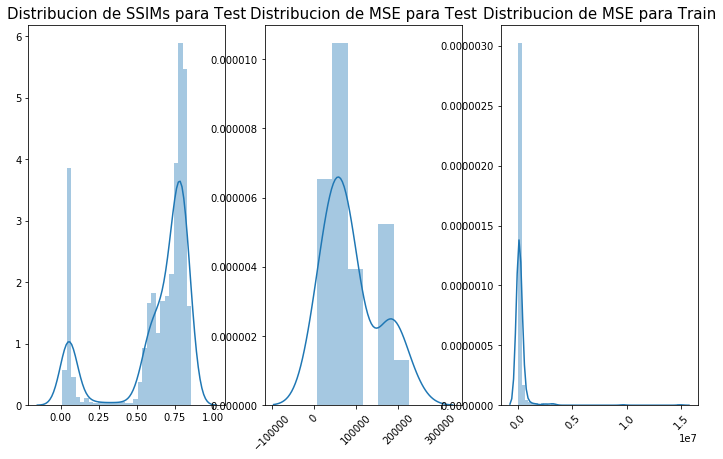

In [ ]:
AEHG_150_100_75_test_losses = get_metrics(AEHG_150_100_75, test_loader_HTH, device = device, losses_train = AEHG_150_100_75_TrainDict['train_losses'])

In [ ]:
#torch.save(AEHG_150_100_75.state_dict(), '/AEHG_150_100_75.pt')
#np.save('/test_losses_sdae_AEHG_150_100_75.npy', AEHG_150_100_75_test_losses)
#np.save('/train_losses_AEHG_150_100_75.npy', AEHG_150_100_75_TrainDict['train_losses'])


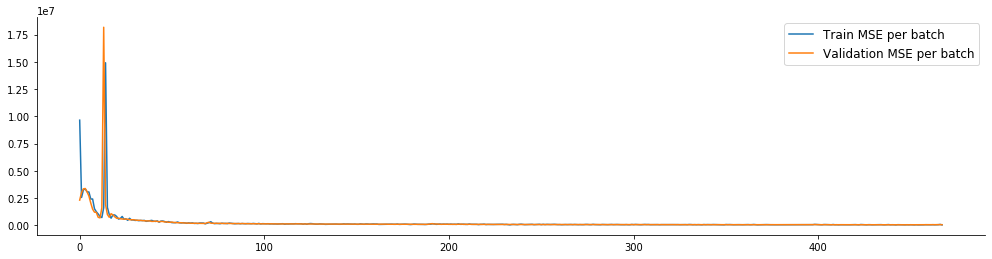

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(AEHG_150_100_75_TrainDict['train_losses'])), y = AEHG_150_100_75_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(AEHG_150_100_75_TrainDict['val_losses'])), y = AEHG_150_100_75_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')

sn.despine()
plt.legend(fontsize = 12);


# Koundinya


## MSE Loss

In [ ]:
koundinya_mse = Koundinya2D_CNN()
koundinya_mse.to(device)


Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
  )
)

In [ ]:
n_epochs = 4
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(koundinya_mse.parameters(), lr = lr)


In [ ]:
koundinya_mse_TrainDict = train_model(koundinya_mse, n_epochs, loss_fn, optimizer, train_loader, val_loader)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4094897.25
	  * Val loss: 4258582.879166666
	Batch N°: 1
	  * Train loss: 4058180.75
	  * Val loss: 4148030.825
	Batch N°: 2
	  * Train loss: 3668737.75
	  * Val loss: 3541544.7125
	Batch N°: 3
	  * Train loss: 4366316.0
	  * Val loss: 3197369.308333333
	Batch N°: 4
	  * Train loss: 3875990.75
	  * Val loss: 2809949.591666667
	Batch N°: 5
	  * Train loss: 3290018.0
	  * Val loss: 2591970.5166666666
	Batch N°: 6
	  * Train loss: 2575591.75
	  * Val loss: 2361824.441666667
	Batch N°: 7
	  * Train loss: 2239963.75
	  * Val loss: 2193240.2416666667
	Batch N°: 8
	  * Train loss: 2156302.25
	  * Val loss: 2036598.7354166666
	Batch N°: 9
	  * Train loss: 3351432.75
	  * Val loss: 1997704.65
	Batch N°: 10
	  * Train loss: 2599747.0
	  * Val loss: 2005101.05625
	Batch N°: 11
	  * Train loss: 1748088.25
	  * Val loss: 1986973.5833333333
	Batch N°: 12
	  * Train loss: 1940762.25
	  * Val loss: 1961679.3625
	Batch N°: 13
	  * Train loss: 1827771.0
	  * Val

Average MSE (Test): 252021.4296875
RMSE (Test): 502.01735994634686
RMSE scaled to reflectance (Test: 0.050201735994634684
Average SSIM(Test): 0.36904696785274255


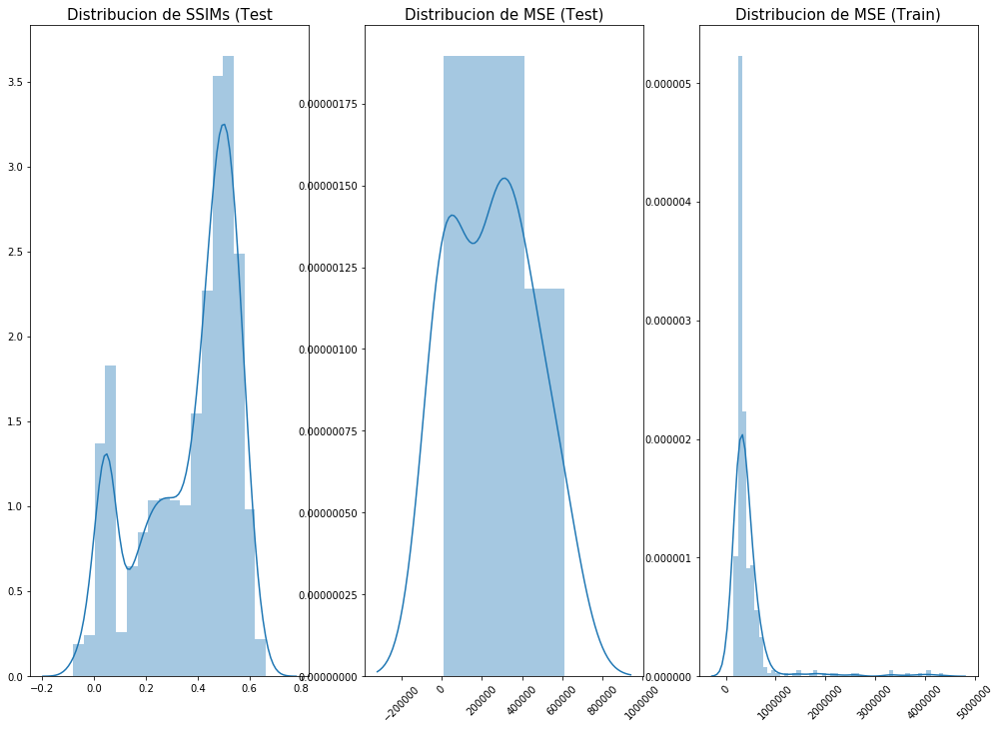

In [ ]:
koundinya_mse_test_losses = get_metrics(koundinya_mse, test_loader, device = device, losses_train = koundinya_mse_TrainDict['train_losses'])

In [ ]:
torch.save(koundinya_mse.state_dict(), BASE_PATH + '/Models/koundinya_mse.pt')


In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len( koundinya_mse_TrainDict['train_losses'])), y =  koundinya_mse_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len( koundinya_mse_TrainDict['val_losses'])), y =  koundinya_mse_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')

sn.despine()
plt.legend(fontsize = 12);

In [ ]:
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches = np.random.choice(scenes_patches_list)
    show_spectral_reconstruction(koundinya_mse, BASE_PATH + '/hyperion_test_npy', BASE_PATH + '/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches, wav_hsi = dfprop_Hyperion, wav_msi= dfprop_L8)

## MSE + Gram Loss

Modelo para la superresolución:

In [ ]:
#save_model_path = '/Koundinya_2DCNN_states_32x5.pt' # batchsize 32 and 5 epochs
koundinya = Koundinya2D_CNN()
#model.load_state_dict(torch.load(save_model_path))
koundinya.to(device)


Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
  )
)

Modelo perceptual

In [ ]:
save_perceptual_model_path = BASE_PATH + '/AEHG_150_100_75.pt'

perceptual_model = Hourglass(175, 175, 150, 100, 75)
perceptual_model.load_state_dict(torch.load(save_perceptual_model_path))
perceptual_model.eval()
perceptual_model.to(device)

Hourglass(
  (encoder_upperBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(175, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(150, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_middleBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(150, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(100, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_lowerBlock): Sequential(
    (0): Conv2d(100, 75, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01, inplace=True)
  )
  (skip2): Sequential(
    (0): Conv2d(150, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  

In [ ]:
n_epochs = 4
lr = 1e-4
loss_fn = GramLoss(perceptual_model)
loss_fn_MSE = MSELoss(reduction = 'mean')
optimizer = optim.Adam(koundinya.parameters(), lr = lr)
train_step = make_train_step(koundinya, loss_fn, optimizer)

losses = []
val_mse = []
val_losses = []

In [ ]:
for epoch in range(n_epochs):
    print(f'Epoch N°: {epoch+1}')
    for batch_n, (x_batch, y_batch) in enumerate(train_loader):
        print(f'\tBatch N°: {batch_n}')
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)
        
        loss = train_step(x_batch, y_batch)
        losses.append(loss)
        print(f'\t  * Train loss (MSE + Gram): {losses[-1]}')
        
        with torch.no_grad():
            val_losses_batch = []
            val_mse_batch = []
            for x_val, y_val in val_loader:
                x_val = x_val.to(device)
                y_val = y_val.to(device)
                
                koundinya.eval()
                
                yhat = koundinya(x_val).reshape(x_val.shape[0], 175, 64, 64)
                val_loss = loss_fn(y_val, yhat)
                val_mse_batch.append(loss_fn_MSE(y_val, yhat).item())
                val_losses_batch.append(val_loss.item())

            val_mse.append(np.mean(val_mse_batch))
            val_losses.append(np.mean(val_losses_batch))
            print(f'\t  * Val loss (MSE + Gram): {val_losses[-1]}')
            print(f'\t  * Val MSE: {val_mse[-1]}')


Epoch N°: 1
	Batch N°: 0
	  * Train loss (MSE + Gram): 4514062.5
	  * Val loss (MSE + Gram): 4629509.658333333
	  * Val MSE: 4551048.15
	Batch N°: 1
	  * Train loss (MSE + Gram): 3766232.0
	  * Val loss (MSE + Gram): 4407507.041666667
	  * Val MSE: 4401256.883333334
	Batch N°: 2
	  * Train loss (MSE + Gram): 4089154.0


KeyboardInterrupt: 

In [ ]:
koundinya_GramLoss_TrainDict = train_model(koundinya, n_epochs, loss_fn, optimizer, train_loader, val_loader)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4913090.5
	  * Val loss: 4414745.283333333
	Batch N°: 1
	  * Train loss: 4149231.0
	  * Val loss: 4092698.754166667
	Batch N°: 2
	  * Train loss: 4255654.0
	  * Val loss: 3855530.4
	Batch N°: 3
	  * Train loss: 3477250.0
	  * Val loss: 3151110.66875
	Batch N°: 4
	  * Train loss: 2961547.0
	  * Val loss: 2597975.6041666665
	Batch N°: 5
	  * Train loss: 2302566.0
	  * Val loss: 1912832.2083333333
	Batch N°: 6
	  * Train loss: 1487983.75
	  * Val loss: 2186764.2958333334
	Batch N°: 7
	  * Train loss: 2554198.25
	  * Val loss: 2093987.1625
	Batch N°: 8
	  * Train loss: 2641482.0
	  * Val loss: 1643074.3541666667
	Batch N°: 9
	  * Train loss: 3125820.75
	  * Val loss: 1378901.6166666667
	Batch N°: 10
	  * Train loss: 1366536.625
	  * Val loss: 1578434.3375
	Batch N°: 11
	  * Train loss: 1370325.125
	  * Val loss: 1762550.9708333334
	Batch N°: 12
	  * Train loss: 1841638.625
	  * Val loss: 1833853.8541666667
	Batch N°: 13
	  * Train loss: 2254667.75


KeyboardInterrupt: 

Average MSE (Test): 322209.3004092262
RMSE (Test): 567.6348301586384
RMSE scaled to reflectance (Test: 0.056763483015863835
Average SSIM(Test): 0.33344815776644726


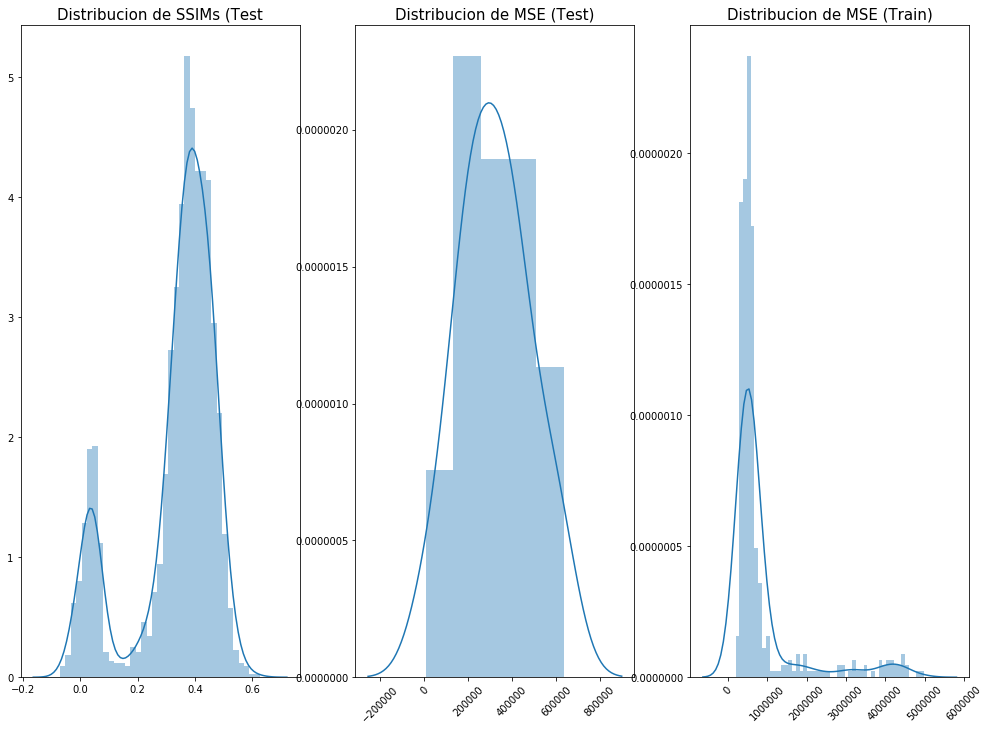

In [ ]:
koundinya_test_losses = get_metrics(koundinya, test_loader, device = device, losses_train = losses)

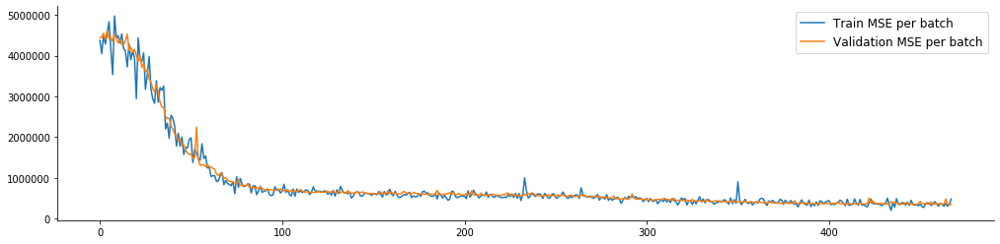

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(losses)), y = losses, 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(val_losses)), y = val_losses, 
            label = 'Validation MSE per batch')

sn.despine()
plt.legend(fontsize = 12);

In [ ]:
#save_model_path = '/koundinya_perceptual.pt'
#torch.save(koundinya.state_dict(), save_model_path)

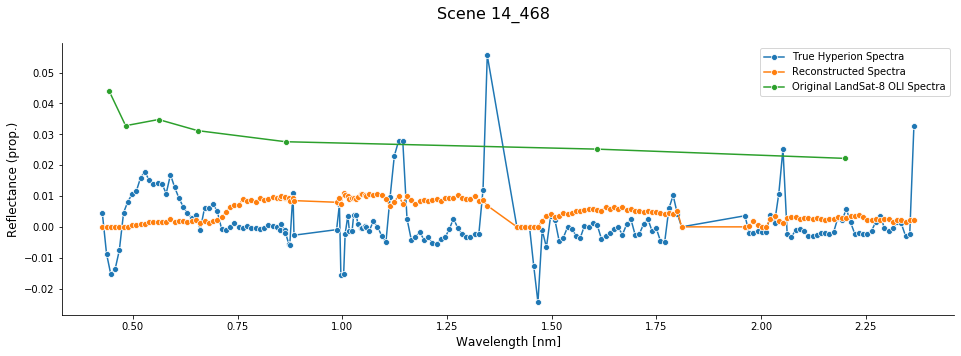

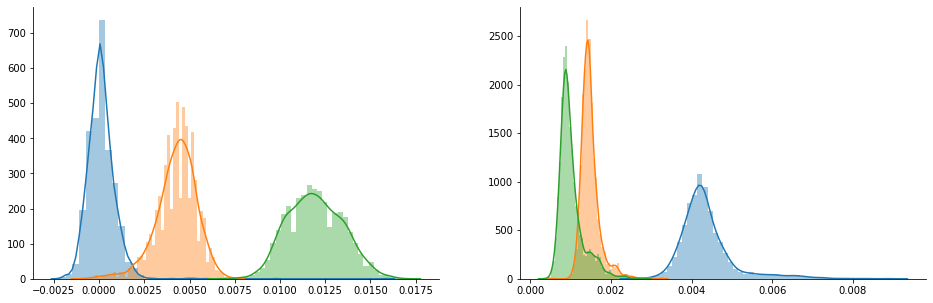

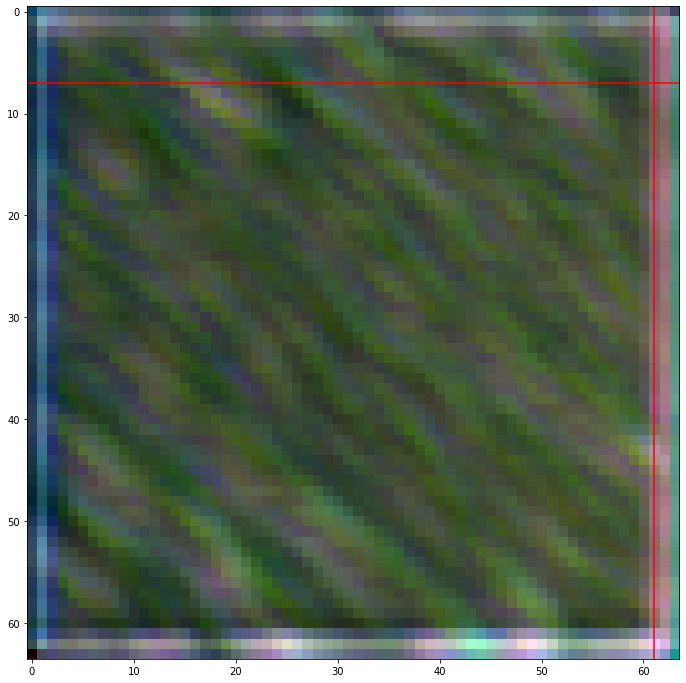

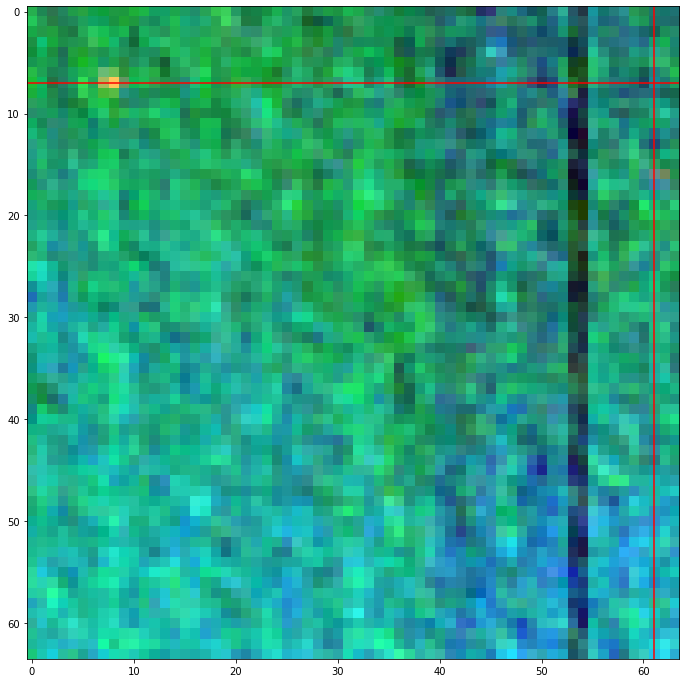

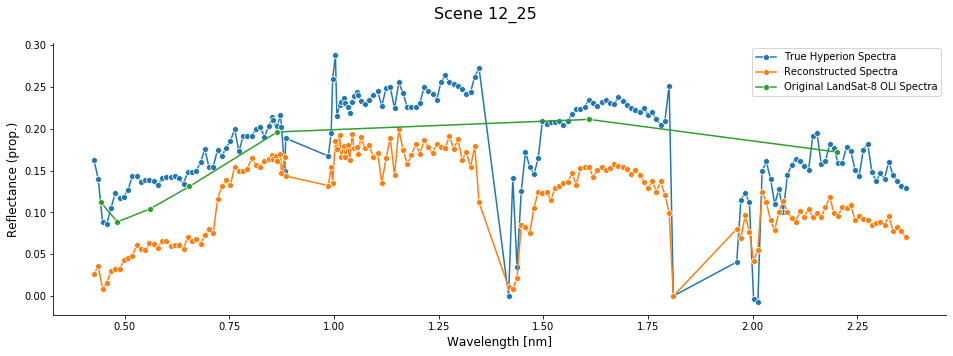

...

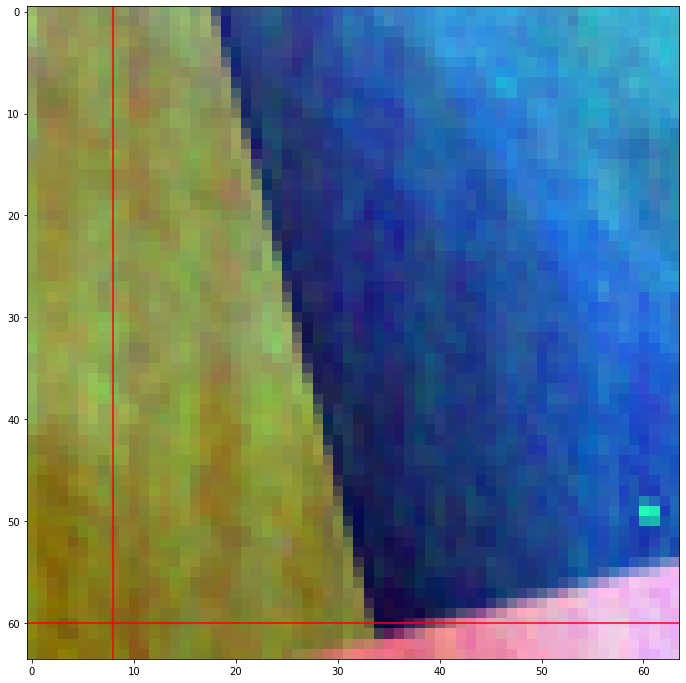

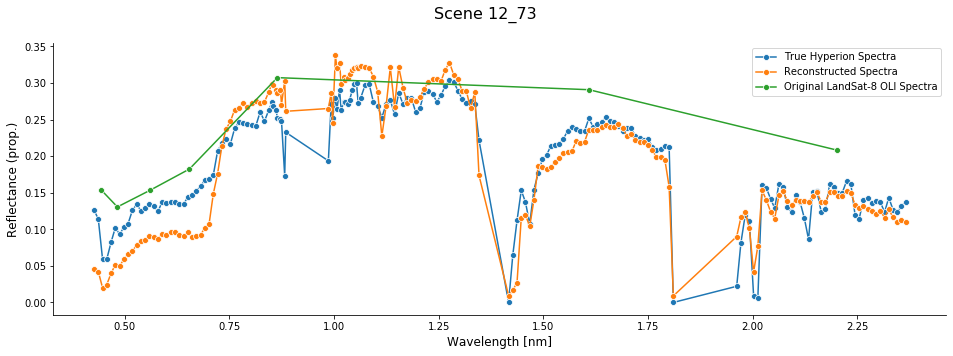

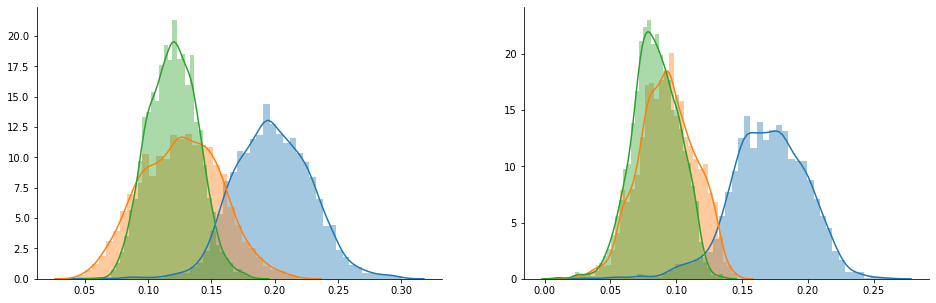

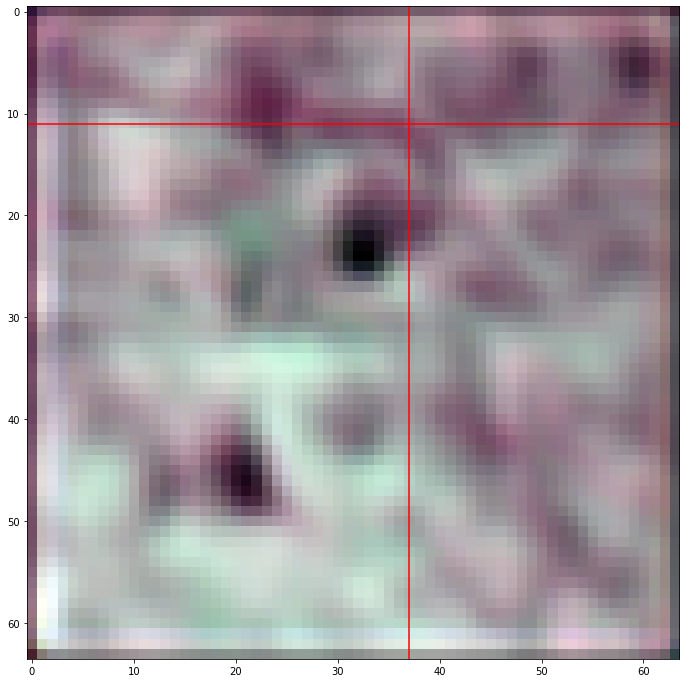

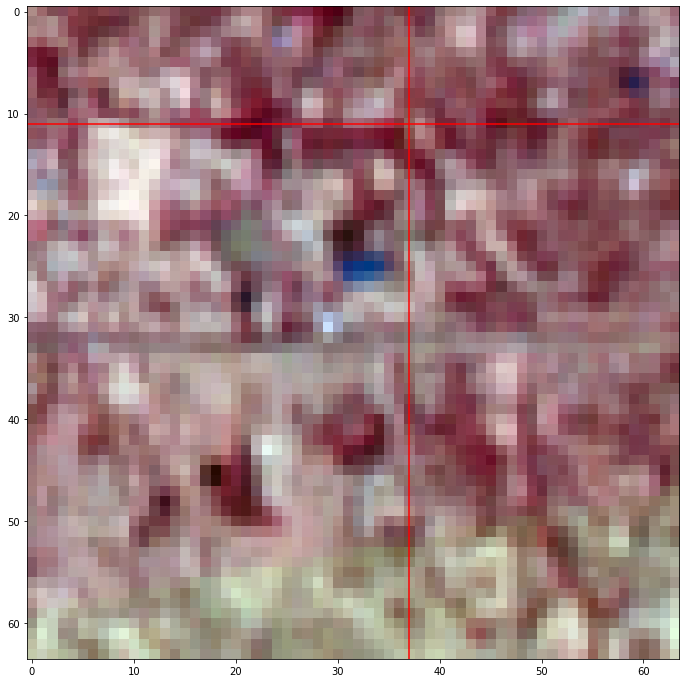

In [ ]:
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches = np.random.choice(scenes_patches_list)
    show_spectral_reconstruction(koundinya, BASE_PATH + '/hyperion_test_npy', BASE_PATH + '/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches, wav_hsi = dfprop_Hyperion, wav_msi= dfprop_L8)



# Hourglass

## MSE Loss

In [ ]:
hg_SR = Hourglass(7, 175, 150, 100, 75)
hg_SR.to(device)
hg_SR.zero_grad()

In [ ]:
summary(hg_SR, input_size=(7, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 150, 64, 64]           9,600
         LeakyReLU-2          [-1, 150, 64, 64]               0
            Conv2d-3          [-1, 150, 64, 64]         202,650
         LeakyReLU-4          [-1, 150, 64, 64]               0
            Conv2d-5          [-1, 100, 64, 64]         375,100
         LeakyReLU-6          [-1, 100, 64, 64]               0
            Conv2d-7          [-1, 100, 64, 64]         250,100
         LeakyReLU-8          [-1, 100, 64, 64]               0
            Conv2d-9           [-1, 75, 64, 64]          67,575
        LeakyReLU-10           [-1, 75, 64, 64]               0
           Conv2d-11           [-1, 75, 64, 64]          50,700
        LeakyReLU-12           [-1, 75, 64, 64]               0
           Conv2d-13           [-1, 75, 64, 64]           7,575
           Conv2d-14          [-1, 100,

In [ ]:
n_epochs = 5
lr = 1e-3
loss_fn = MSELoss(reduction = 'mean')
optimizer = optim.Adam(hg_SR.parameters(), lr = lr)


In [ ]:
hg_SR_150_100_75_TrainDict = train_model(hg_SR, n_epochs, loss_fn, optimizer, train_loader, val_loader)

Epoch N°: 1
	Batch N°: 0
	  * Train loss: 4615274.5
	  * Val loss: 3012279.029166667
	Batch N°: 1
	  * Train loss: 3039379.25
	  * Val loss: 3289625.7
	Batch N°: 2
	  * Train loss: 3319269.75
	  * Val loss: 1563905.4625
	Batch N°: 3
	  * Train loss: 1846912.375
	  * Val loss: 1871791.3791666667
	Batch N°: 4
	  * Train loss: 1887087.125
	  * Val loss: 966276.6354166666
	Batch N°: 5
	  * Train loss: 966037.8125
	  * Val loss: 2155075.754166667
	Batch N°: 6
	  * Train loss: 3131911.0
	  * Val loss: 873498.7677083333
	Batch N°: 7
	  * Train loss: 841988.8125
	  * Val loss: 1065541.4192708333
	Batch N°: 8
	  * Train loss: 1209651.875
	  * Val loss: 1128154.9041666666
	Batch N°: 9
	  * Train loss: 1253286.75
	  * Val loss: 973056.365625
	Batch N°: 10
	  * Train loss: 824646.5625
	  * Val loss: 862018.49375
	Batch N°: 11
	  * Train loss: 953018.75
	  * Val loss: 1085752.4479166667
	Batch N°: 12
	  * Train loss: 972115.1875
	  * Val loss: 1151274.45625
	Batch N°: 13
	  * Train loss: 965015.187

Average MSE (Test): 202748.3334263393
RMSE (Test): 450.27584148645957
RMSE scaled to reflectance (Test: 0.04502758414864596
Average SSIM(Test): 0.43174558682117925


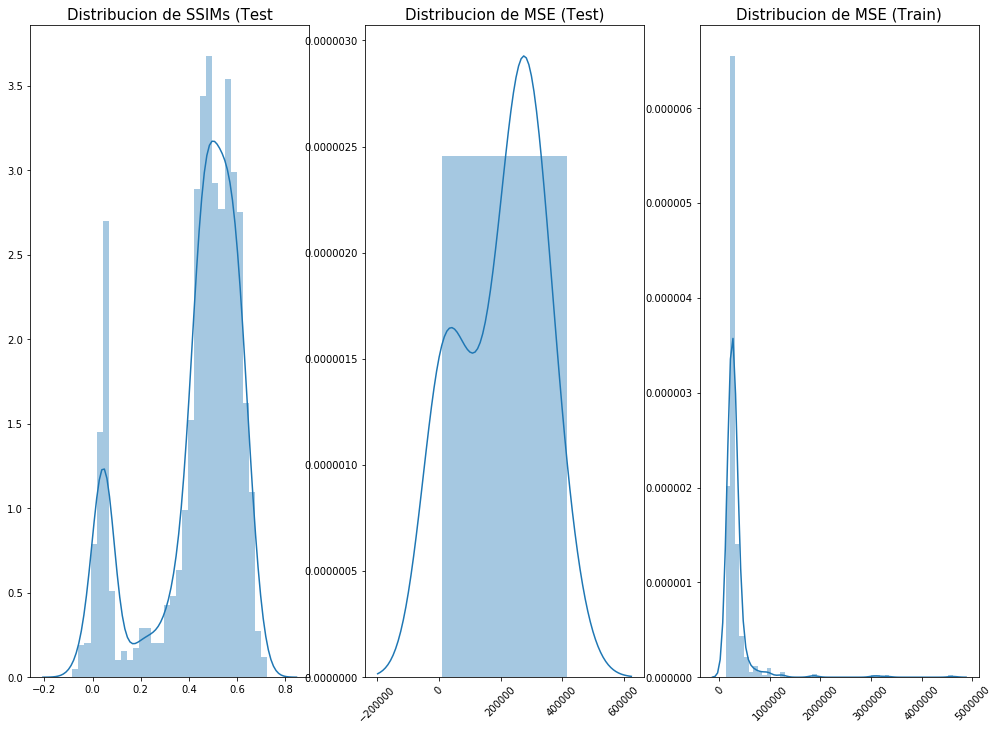

In [ ]:
hg_SR_150_100_75_test_losses = get_metrics(hg_SR, test_loader, device = device, losses_train = hg_SR_150_100_75_TrainDict['train_losses'])

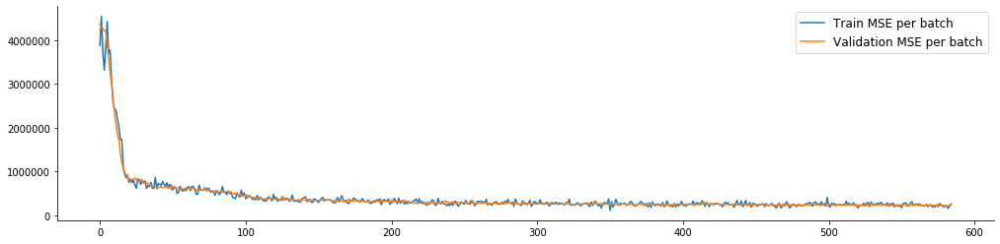

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(hg_SR_150_100_75_TrainDict['train_losses'])), y = hg_SR_150_100_75_TrainDict['train_losses'], 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(hg_SR_150_100_75_TrainDict['val_losses'])), y = hg_SR_150_100_75_TrainDict['val_losses'], 
            label = 'Validation MSE per batch')

sn.despine()
plt.legend(fontsize = 12);

In [ ]:
#save_model_path = '/hg_SR_150_100_75.pt'
#torch.save(hg_SR.state_dict(), save_model_path)


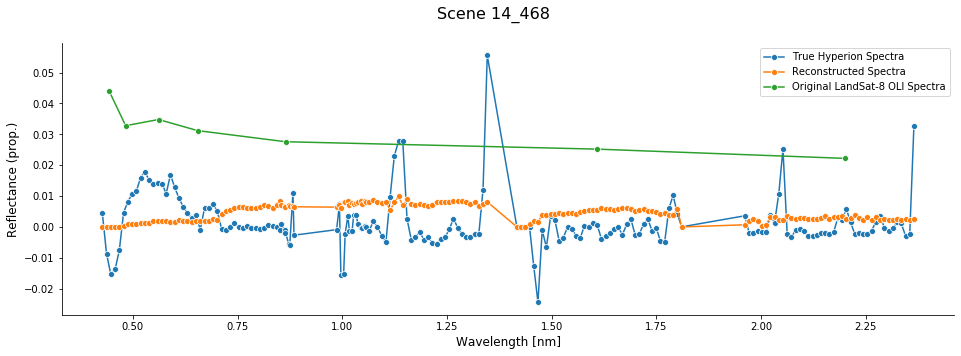

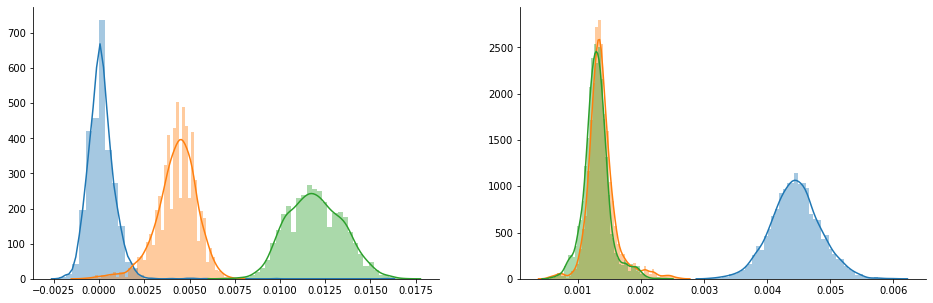

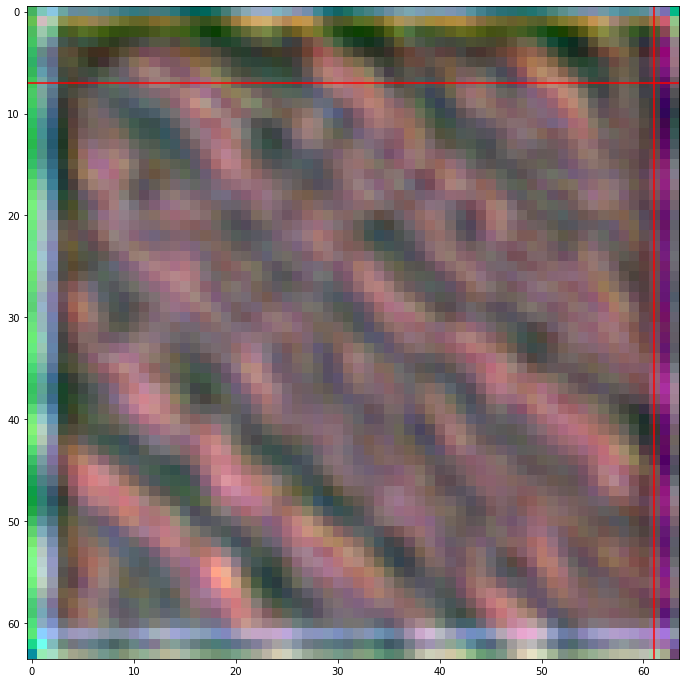

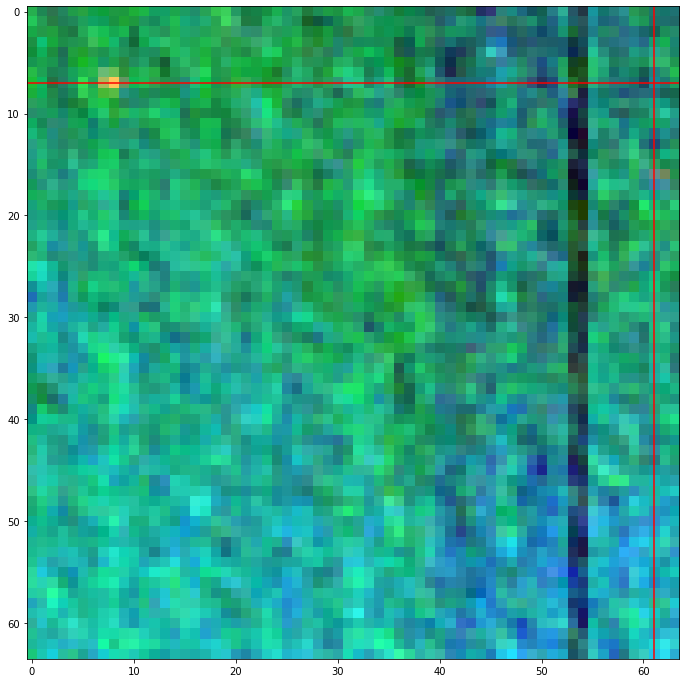

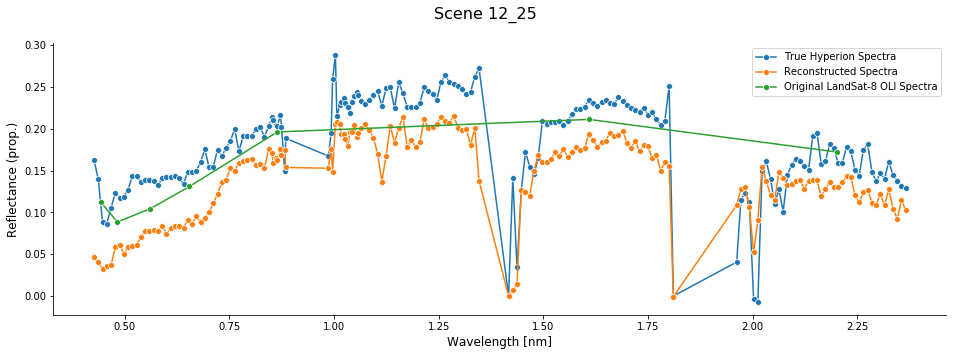

...

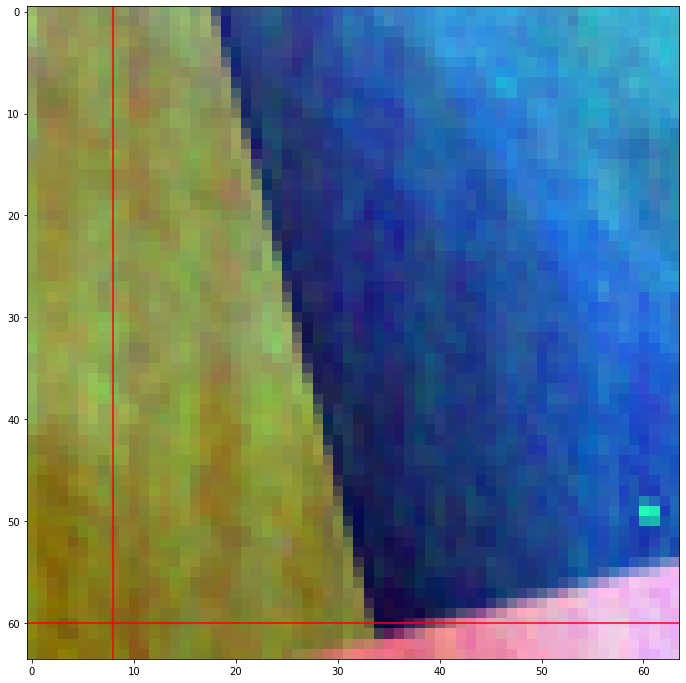

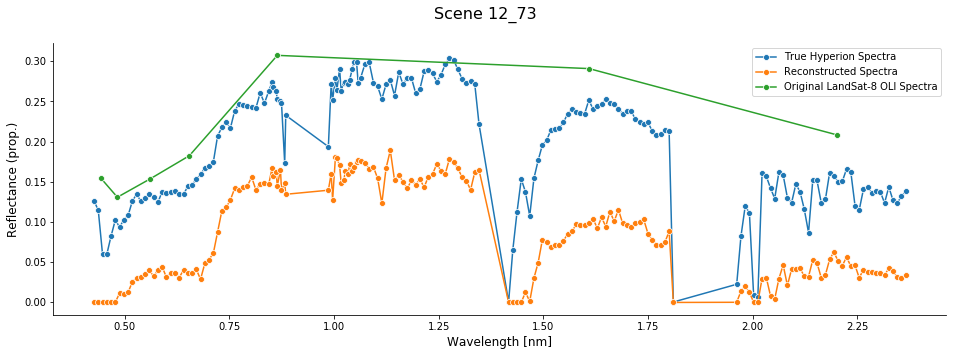

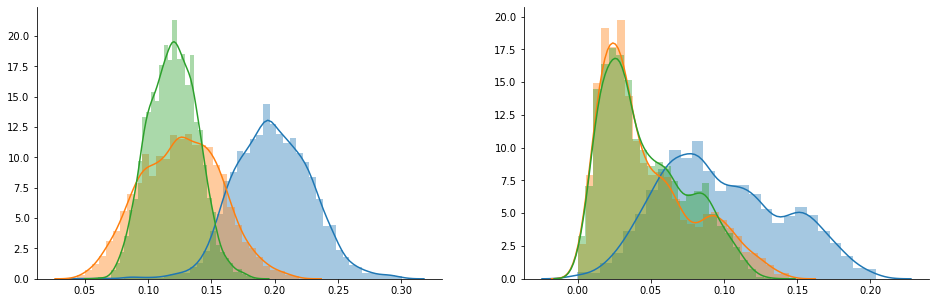

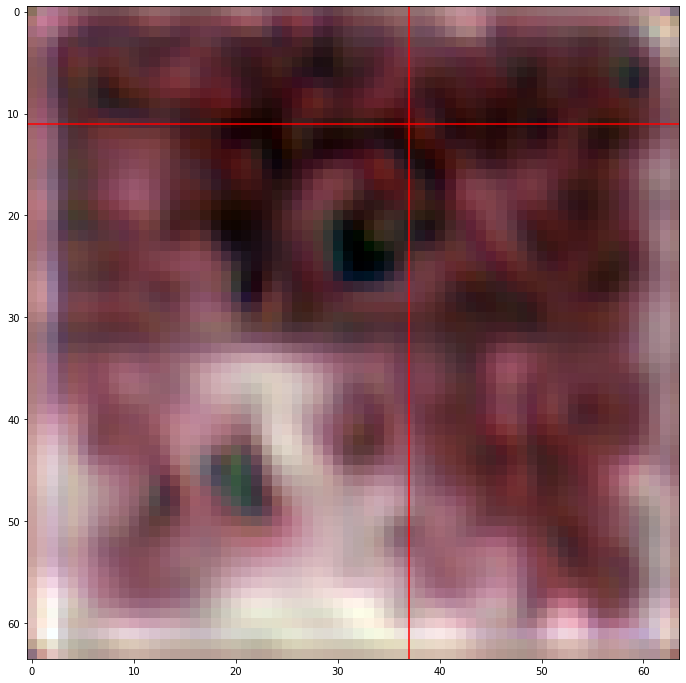

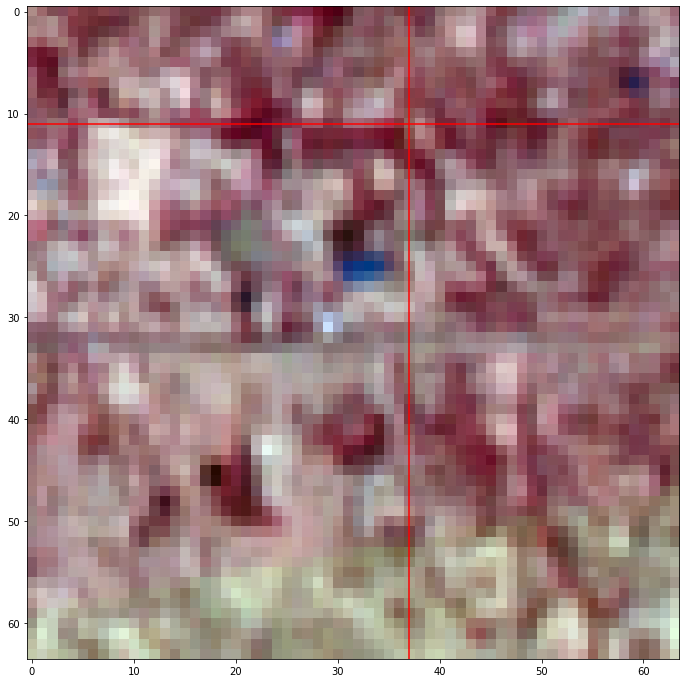

In [ ]:
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches = np.random.choice(scenes_patches_list)
    show_spectral_reconstruction(hg_SR, BASE_PATH + '/hyperion_test_npy', BASE_PATH + '/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches, wav_hsi = dfprop_Hyperion, wav_msi= dfprop_L8)

## MSE + Gram Loss

In [ ]:
hg_SR_150_100_75_perceptualTrained = Hourglass(7, 175, 150, 100, 75)
hg_SR_150_100_75_perceptualTrained.to(device);

In [10]:
save_perceptual_model_path = BASE_PATH + '/Models/AEHG_150_100_75.pt'
perceptual_model = Hourglass(175, 175, 150, 100, 75)
perceptual_model.load_state_dict(torch.load(save_perceptual_model_path))
perceptual_model.to(device)

Hourglass(
  (encoder_upperBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(175, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(150, 150, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_middleBlock): Sequential(
    (0): Sequential(
      (0): Conv2d(150, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(100, 100, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (encoder_lowerBlock): Sequential(
    (0): Conv2d(100, 75, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01, inplace=True)
  )
  (skip2): Sequential(
    (0): Conv2d(150, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  

In [ ]:
loss_fn = GramLoss(perceptual_model, both = False)
loss_fn_MSE = MSELoss(reduction = 'mean')
optimizer = optim.Adam(hg_SR_150_100_75_perceptualTrained.parameters(), lr = lr)
train_step = make_train_step(hg_SR_150_100_75_perceptualTrained, loss_fn, optimizer)
n_epochs = 3
lr = 1e-4

losses = []
val_mse = []
val_losses = []

In [ ]:
for epoch in range(n_epochs):
    print(f'Epoch N°: {epoch+1}')
    for batch_n, (x_batch, y_batch) in enumerate(train_loader):
        print(f'\tBatch N°: {batch_n}')
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)
        
        loss = train_step(x_batch, y_batch)
        losses.append(loss)
        print(f'\t  * Train loss (MSE + Gram): {losses[-1]}')
        
        with torch.no_grad():
            val_losses_batch = []
            val_mse_batch = []
            for x_val, y_val in val_loader:
                x_val = x_val.to(device)
                y_val = y_val.to(device)
                
                hg_SR_150_100_75_perceptualTrained.eval()
                
                yhat = hg_SR_150_100_75_perceptualTrained(x_val).reshape(x_val.shape[0], 175, 64, 64)
                val_loss = loss_fn(y_val, yhat)
                val_mse_batch.append( loss_fn_MSE(y_val, yhat).item())
                val_losses_batch.append(val_loss.item())

            val_mse.append(np.mean(val_mse_batch))
            val_losses.append(np.mean(val_losses_batch))
            print(f'\t  * Val loss (MSE + Gram): {val_losses[-1]}')
            print(f'\t  * Val MSE: {val_mse[-1]}')


Epoch N°: 1
	Batch N°: 0
	  * Train loss (MSE + Gram): 4120133.25
	  * Val loss (MSE + Gram): 4360922.441666666
	  * Val MSE: 4354639.033333333
	Batch N°: 1
	  * Train loss (MSE + Gram): 4342816.0
	  * Val loss (MSE + Gram): 4333261.291666667
	  * Val MSE: 4324092.575
	Batch N°: 2
	  * Train loss (MSE + Gram): 3962243.75
	  * Val loss (MSE + Gram): 4448726.266666667
	  * Val MSE: 4370871.55
	Batch N°: 3
	  * Train loss (MSE + Gram): 4109100.5
	  * Val loss (MSE + Gram): 4409035.45
	  * Val MSE: 4338547.325
	Batch N°: 4
	  * Train loss (MSE + Gram): 3957687.0
	  * Val loss (MSE + Gram): 4279632.058333334
	  * Val MSE: 4211347.283333333
	Batch N°: 5
	  * Train loss (MSE + Gram): 3892825.25
	  * Val loss (MSE + Gram): 3966446.1666666665
	  * Val MSE: 3932757.9166666665
	Batch N°: 6
	  * Train loss (MSE + Gram): 4327234.0
	  * Val loss (MSE + Gram): 3835978.283333333
	  * Val MSE: 3748207.3583333334
	Batch N°: 7
	  * Train loss (MSE + Gram): 3464382.0
	  * Val loss (MSE + Gram): 3372758.66

Average MSE (Test): 314406.70172991074
RMSE (Test): 560.7198067929389
RMSE scaled to reflectance (Test: 0.05607198067929389
Average SSIM(Test): 0.417923298674478


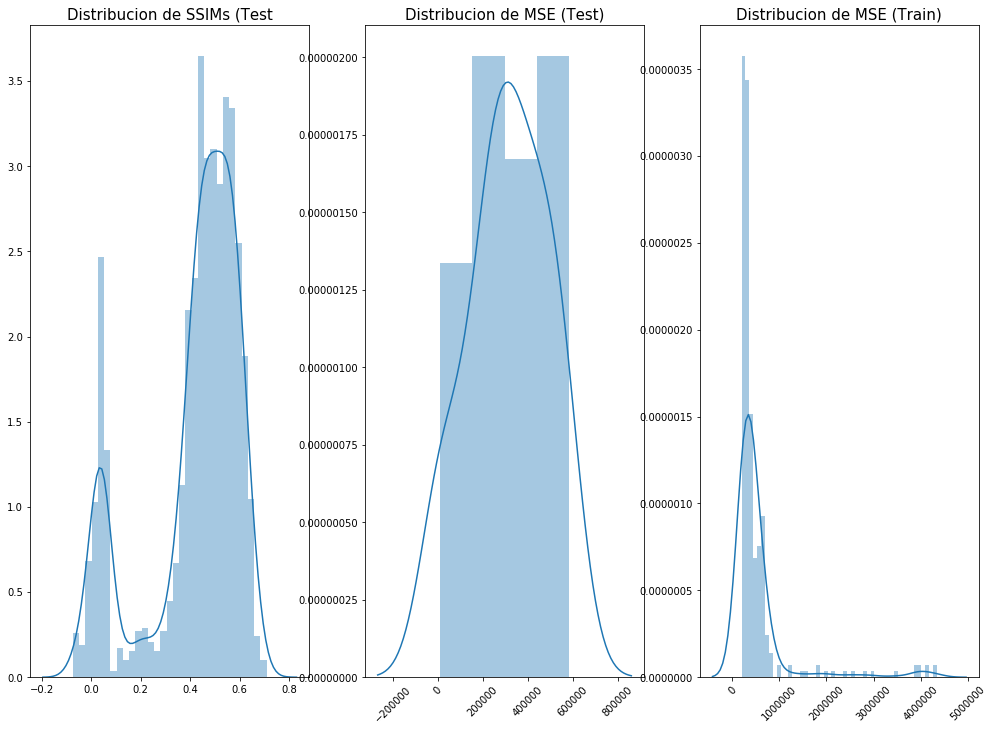

In [ ]:
hg_SR_150_100_75_perceptualTrained_test_losses = get_metrics(
                                                        hg_SR_150_100_75_perceptualTrained, 
                                                        test_loader, 
                                                        device = device, 
                                                        losses_train = losses)

In [ ]:
#save_model_path = '/hg_SR_150_100_75_perceptual.pt'
#torch.save(hg_SR_150_100_75_perceptualTrained.state_dict(), save_model_path)


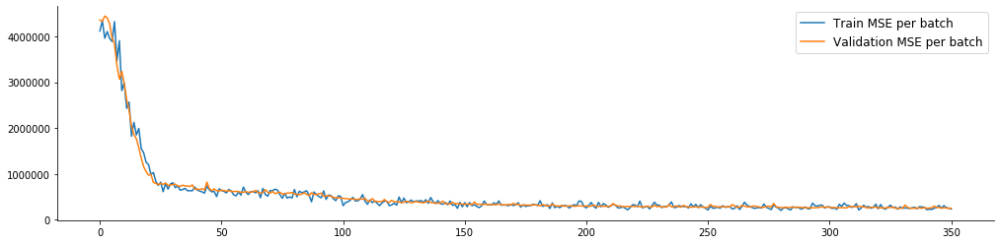

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(losses)), y = losses, 
            label = 'Train MSE per batch')
sn.lineplot(x = range(len(val_losses)), y = val_losses, 
            label = 'Validation MSE per batch')
sn.despine()
plt.legend(fontsize = 12);


Reconstrucciones

<Figure size 720x720 with 0 Axes>

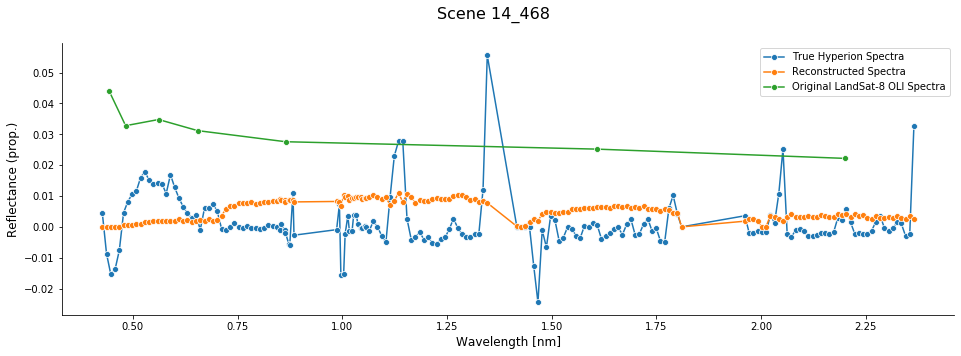

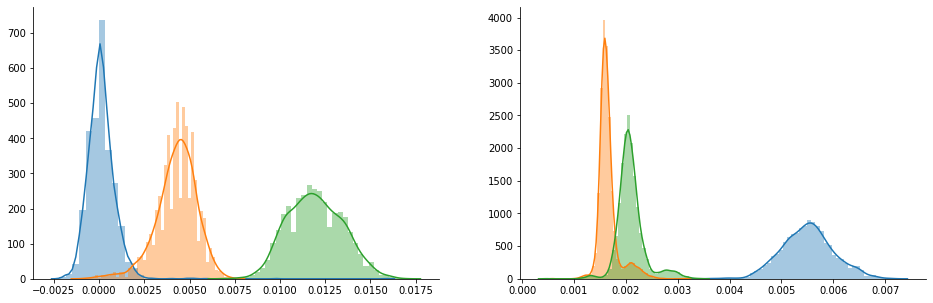

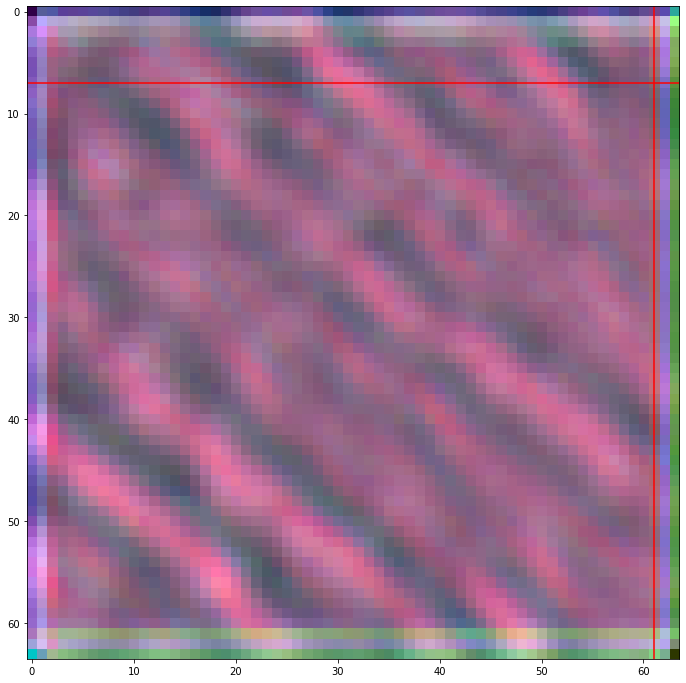

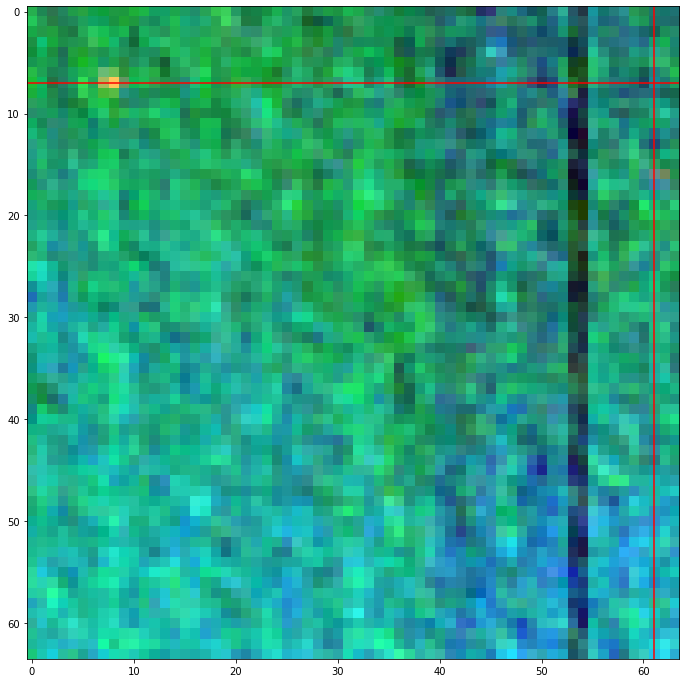

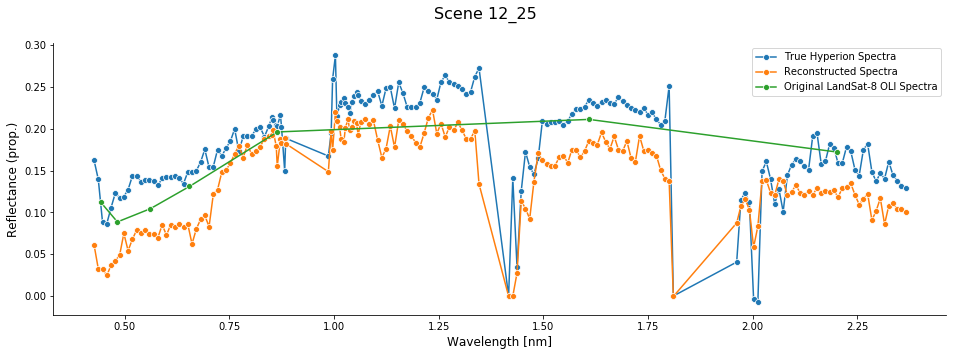

...

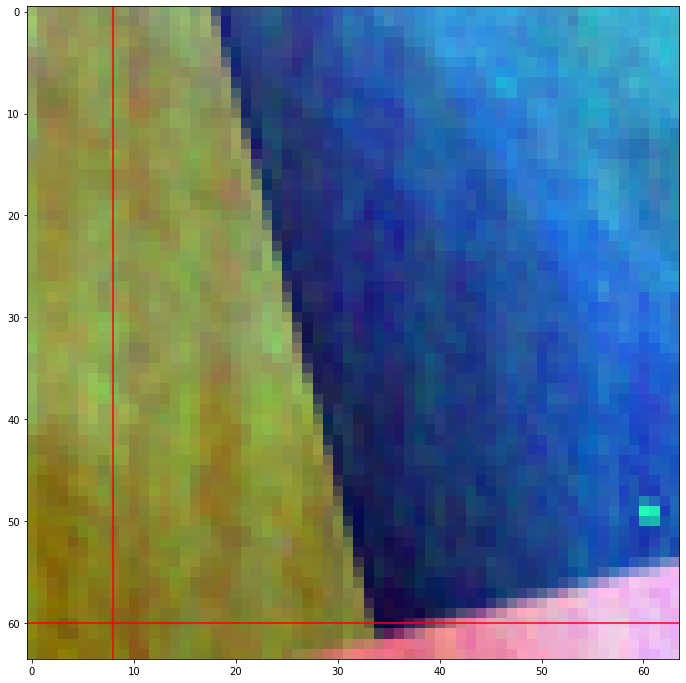

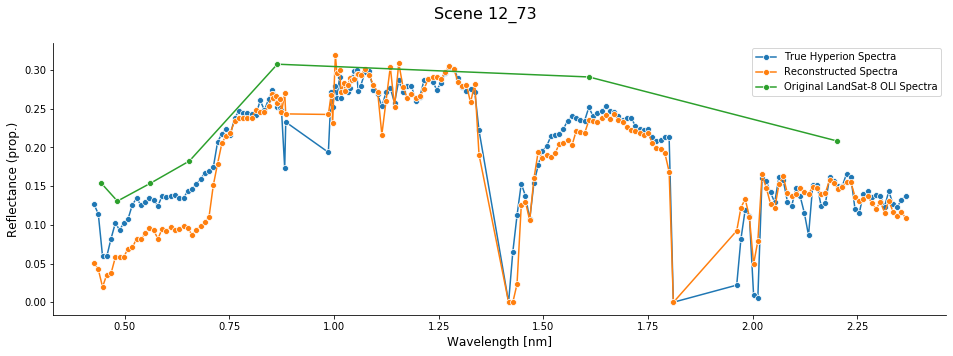

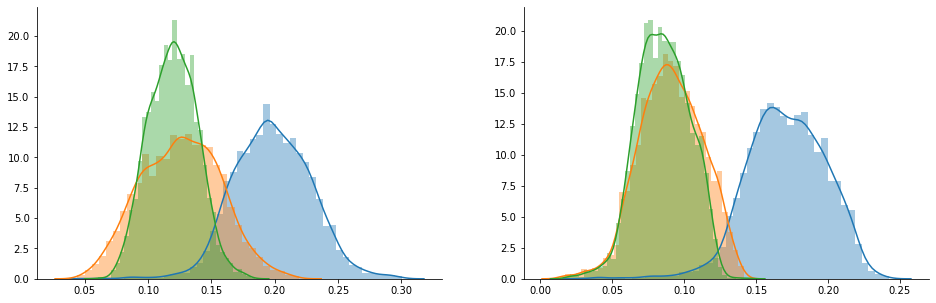

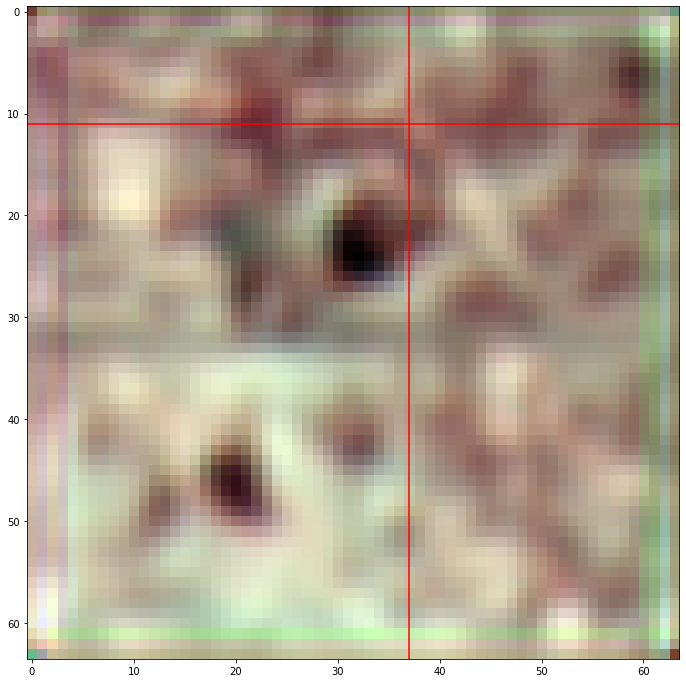

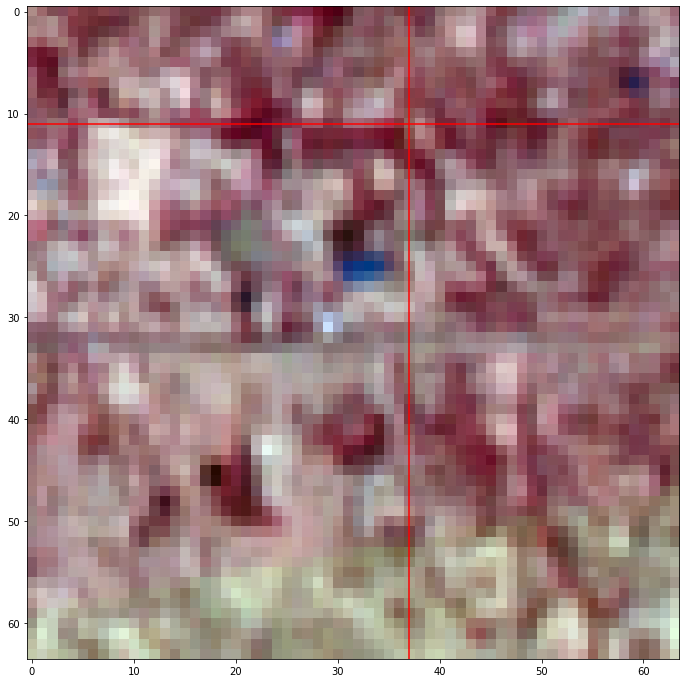

In [ ]:
plt.figure(figsize = (10,10))
np.random.seed(11235813)
for i in range(15):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches = np.random.choice(scenes_patches_list)
    show_spectral_reconstruction(hg_SR_150_100_75_perceptualTrained, BASE_PATH + '/hyperion_test_npy', BASE_PATH + '/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches, wav_hsi = dfprop_Hyperion, wav_msi= dfprop_L8)

-------
# Resultados

## Modelos para SR

<style type="text/css">
.tg  {border-collapse:collapse;border-color:#93a1a1;border-spacing:0;}
.tg td{background-color:#fdf6e3;border-color:#93a1a1;border-style:solid;border-width:1px;color:#002b36;
  font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg th{background-color:#657b83;border-color:#93a1a1;border-style:solid;border-width:1px;color:#fdf6e3;
  font-family:Arial, sans-serif;font-size:14px;font-weight:normal;overflow:hidden;padding:10px 5px;word-break:normal;}
.tg .tg-baqh{text-align:center;vertical-align:top}
.tg .tg-a1rj{background-color:#dae8fc;color:#002b36;font-weight:bold;text-align:center;vertical-align:top}
.tg .tg-amwm{font-weight:bold;text-align:center;vertical-align:top}
</style>
<table class="tg">
<thead>
  <tr>
    <th class="tg-a1rj">Modelo</th>
    <th class="tg-a1rj">Loss</th>
    <th class="tg-a1rj">MSE Test</th>
    <th class="tg-a1rj">RMSE  - Reflectance Scaled (Test)</th>
    <th class="tg-a1rj">SSIM Medio sobre Test</th>
  </tr>
</thead>
<tbody>
  <tr>
    <td class="tg-baqh">Koundinya</td>
    <td class="tg-baqh">MSE</td>
    <td class="tg-amwm">252021.429</td>
    <td class="tg-amwm">0.05020</td>
    <td class="tg-baqh">0.36904</td>
  </tr>
  <tr>
    <td class="tg-baqh">Koundinya</td>
    <td class="tg-baqh">MSE + Gram</td>
    <td class="tg-baqh">322209.300</td>
    <td class="tg-baqh">0.05676</td>
    <td class="tg-baqh">0.33344</td>
  </tr>
  <tr>
    <td class="tg-baqh">Hourglass</td>
    <td class="tg-baqh">MSE</td>
    <td class="tg-baqh">264242.197</td>
    <td class="tg-baqh">0.05140</td>
    <td class="tg-baqh">0.38768</td>
  </tr>
  <tr>
    <td class="tg-baqh">Hourglass</td>
    <td class="tg-baqh">MSE + Gram</td>
    <td class="tg-baqh">314406.701</td>
    <td class="tg-baqh">0.05607</td>
    <td class="tg-amwm">0.41792</td>
  </tr>
</tbody>
</table>

## Modelos AE para pérdida perceptual

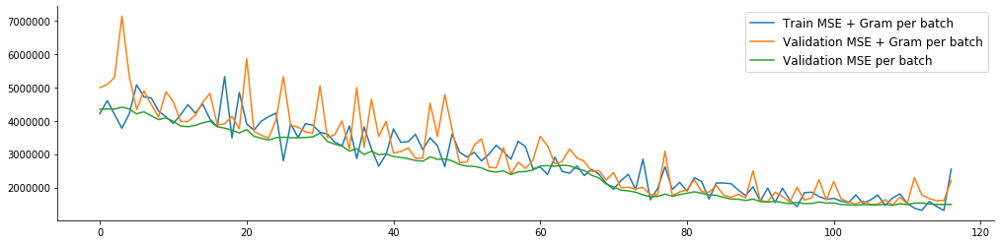

In [ ]:
fig, _ = plt.subplots(figsize = (17,4))

sn.lineplot(x = range(len(losses)), y = losses, 
            label = 'Train MSE + Gram per batch')
sn.lineplot(x = range(len(val_losses)), y = val_losses, 
            label = 'Validation MSE + Gram per batch')
sn.lineplot(x = range(len(val_mse)), y = val_mse, 
            label = 'Validation MSE per batch')
#sn.lineplot(x = range(len(patch_landsat[pos_row,pos_col,:])), y = patch_landsat[pos_row, pos_col, :]/10000,
#            label = 'Original LandSat-8 OLI Spectra', ax = ax[1])
sn.despine()
plt.legend(fontsize = 12);


In [ ]:
df_spectral_test = SpectralDataset_npy('Images/landsat_test_npy', 'Images/hyperion_test_npy')
test_loader = DataLoader(dataset = df_spectral_test, batch_size = 1, shuffle = True)

In [ ]:
ssim = SSIM()

In [ ]:
save_model_path = '/Koundinya_2DCNN_states_32x5.pt' # batchsize 32 and 5 epochs
model2 = Koundinya2D_CNN()
model2.load_state_dict(torch.load(save_model_path))
model2.to(device)
model2.eval()

Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
  )
)

In [ ]:
# No prints
test_ssims = []
#loss_fn = MSELoss(reduction = 'mean')

with torch.no_grad():
    for i, (x_test, y_test) in enumerate(test_loader):
        x_test = x_test.to(device)
        #y_test = y_test.to(device).squeeze(0).reshape(175,64,64).permute(1,2,0)
        y_test = y_test.to(device)
        model.eval()
        
        #yhat = model(x_test).squeeze(0).reshape(175,64,64).permute(1,2,0) #queda lista
        yhat = model(x_test)
        yhat = yhat.reshape(1,175,64,64)
        test_ssim = ssim(y_test, yhat)
        test_ssims.append(test_ssim.item())
        #print(f'ssim: {test_ssims[-1]}')
        #print(f'\nRMSE img {i}: {np.sqrt(test_loss.item())/10000}')
        #imshow(yhat.to('cpu').detach().numpy()/10000, (29, 20, 12))
        #imshow(y_test.to('cpu').detach().numpy()/10000, (29, 20, 12))
        #plt.show()

In [ ]:
print(f'Average SSIM Test Set: {np.mean(test_ssims)}')

Average SSIM Test Set: 0.25460534631514115


In [ ]:
#np.save('/Testlosses_Koundinya_2DCNN_states_32x5_gram_mse.npy', np.array(test_losses))
#np.save('/Trainlosses_Koundinya_2DCNN_states_32x5_gram_mse.npy', np.array(losses))
#np.save('/Vallosses_Koundinya_2DCNN_states_32x5_gram_mse.npy', np.array(val_losses))

In [ ]:
test_losses = []
loss_fn = MSELoss(reduction = 'mean')

with torch.no_grad():
    for i, (x_test, y_test) in enumerate(test_loader):
        if i == 21:
            break
        x_test = x_test.to(device)
        y_test = y_test.to(device).squeeze(0).reshape(175,64,64).permute(1,2,0)
        
        model.eval()
        
        yhat = model(x_test).squeeze(0).reshape(175,64,64).permute(1,2,0) #queda lista
        test_loss = loss_fn(y_test, yhat)
        test_losses.append(test_loss.item())

In [ ]:
print(f'Average MSE Test Set: {np.mean(test_losses)}')
print(f'RMSE Test Set: {np.sqrt(np.mean(test_losses))}')
print(f'RMSE Test Set scaled to reflectance: {np.sqrt(np.mean(test_losses))/10000}')
print(f'Average SSIM Test Set: {np.mean(test_ssims)}')

Average MSE Test Set: 430631.44921875
RMSE Test Set: 656.2251513152708
RMSE Test Set scaled to reflectance: 0.06562251513152707
Average SSIM Test Set: 0.25460534631514115


------

In [ ]:
#save_model_path = '/Koundinya_2DCNN_states_32x5_gram_mse_4epochs.pt'
#model = Koundinya2D_CNN()
#model.load_state_dict(torch.load(save_model_path))
#model.to(device)
#model.eval()

Koundinya2D_CNN(
  (cnn_layers): Sequential(
    (0): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(7, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(7, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(60, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(100, 175, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
  )
)

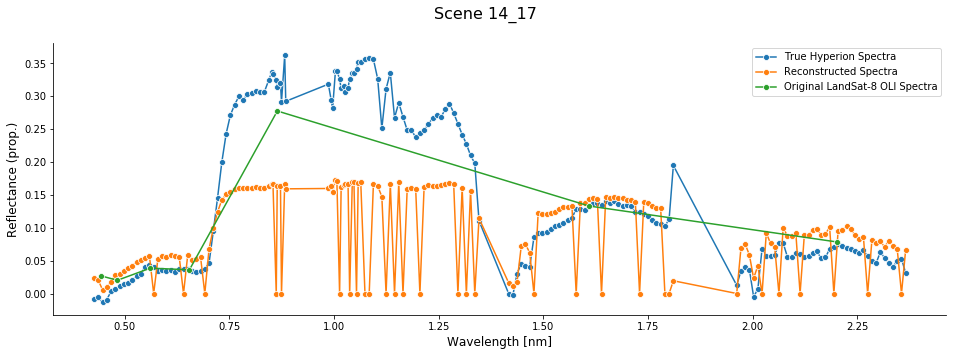

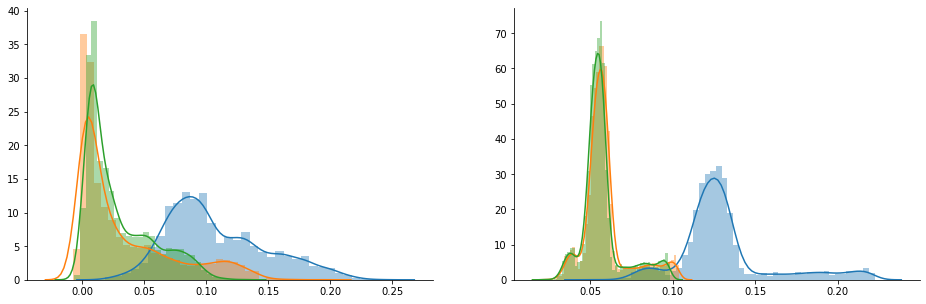

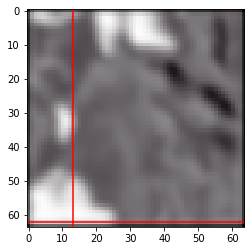

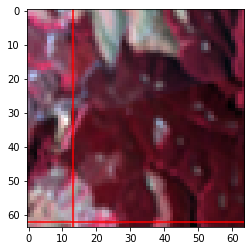

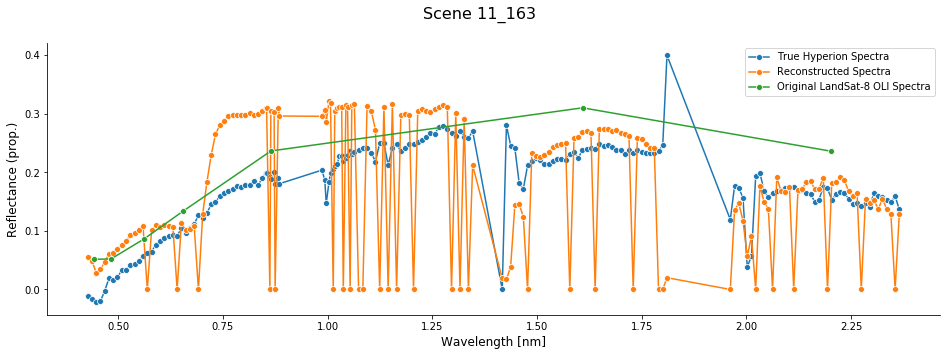

...

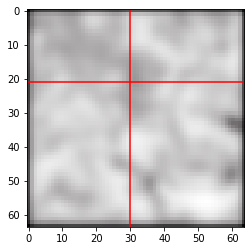

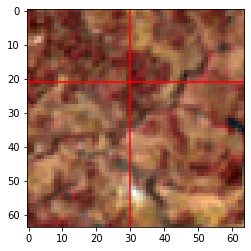

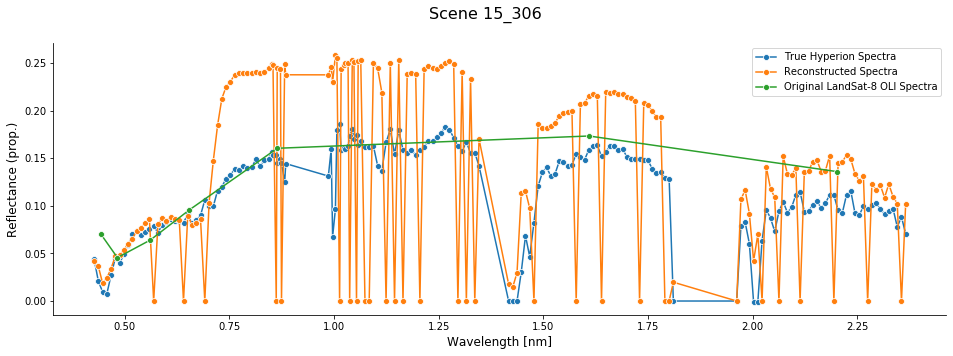

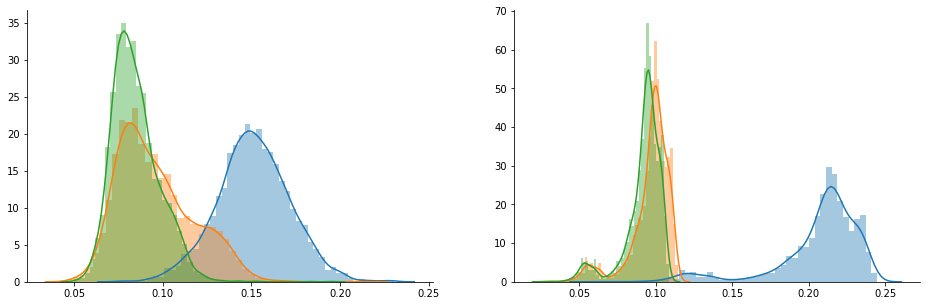

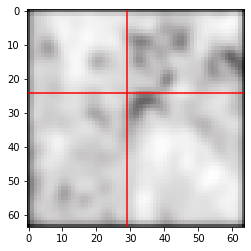

KeyboardInterrupt: 

In [ ]:

np.random.seed(60)
for i in range(30):
    random_row, random_col = np.random.choice(range(0,64)), np.random.choice(range(0,64))
    scenes_patches = np.random.choice(scenes_patches_list)
    show_spectral_reconstruction(model, 'Images/hyperion_test_npy', 'Images/landsat_test_npy', random_row,
                                 random_col, scene_patch = scenes_patches, wav_hsi = dfprop_Hyperion, wav_msi= dfprop_L8)